## Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
from sklearn.model_selection import train_test_split
import cv2

## Data preprocessing

### Creating a folder to store the edge images

In [2]:
edge_path = os.path.join(r"D:\Data", "Edges")

if not os.path.isdir(edge_path):
        os.makedirs(edge_path)

### Creating a function to extract features from the images and plot them

In [3]:
dir_path = ''

# A Function to attract features from the images
def draw_contour(img_path):
    # Let's load an image with some figures
    path = os.path.join(dir_path, img_path)
    image = cv2.imread(path)

    ret, img_thresh = cv2.threshold(image, 150, 255, cv2.THRESH_BINARY)

    edged = cv2.Canny(img_thresh, 100, 150)

    fig = plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 4, 1)
    plt.title("Original")
    plt.imshow(image)


    plt.subplot(1, 4, 2)
    plt.title("contour")
    plt.imshow(img_thresh)


    # Finding Contours
    # Use a copy of your image e.g. edged.copy(), since findContours alters the image
    contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    plt.subplot(1, 4, 3)
    plt.title("Edges After Contouring")
    plt.imshow(edged)

    print("Number of figures (contours) found = " + str(len(contours)))

    # Draw all contours
    # Use '-1' as the 3rd parameter to draw all
    cv2.drawContours(image, contours, -1, (0,255,0), 3)

    plt.subplot(1, 4, 4)
    plt.title("Contours with Edges")
    plt.imshow(image)
    
    fig.suptitle(img_path, y= 0.25)
    fig.tight_layout()

    cv2.imwrite(os.path.join(edge_path, "Edge_" + img_path), edged)

Number of figures (contours) found = 321
Number of figures (contours) found = 504
Number of figures (contours) found = 656
Number of figures (contours) found = 366
Number of figures (contours) found = 482
Number of figures (contours) found = 339
Number of figures (contours) found = 726
Number of figures (contours) found = 1069
Number of figures (contours) found = 497
Number of figures (contours) found = 926
Number of figures (contours) found = 580
Number of figures (contours) found = 691
Number of figures (contours) found = 1120
Number of figures (contours) found = 384
Number of figures (contours) found = 346
Number of figures (contours) found = 265
Number of figures (contours) found = 60
Number of figures (contours) found = 248
Number of figures (contours) found = 444
Number of figures (contours) found = 942


D:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


Number of figures (contours) found = 221
Number of figures (contours) found = 215
Number of figures (contours) found = 142


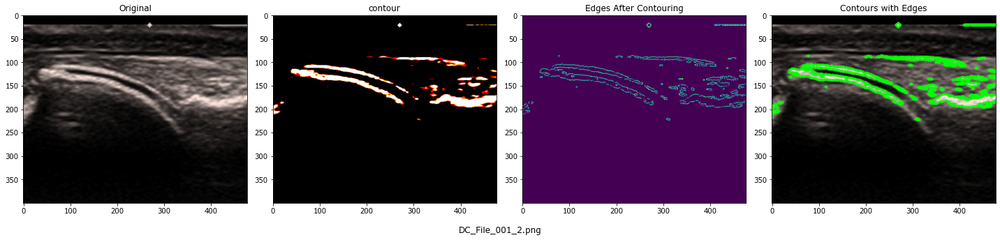

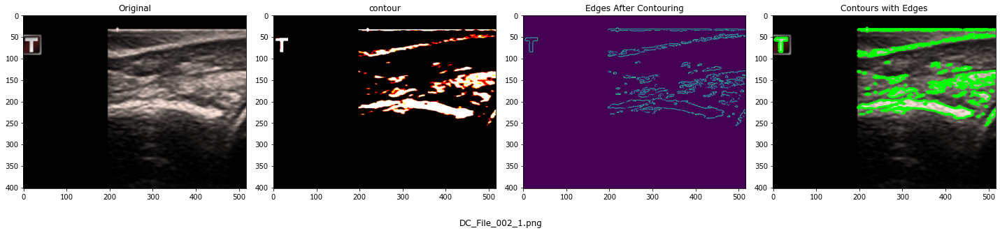

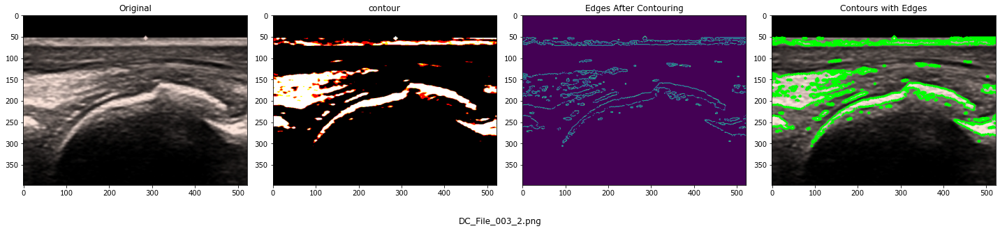

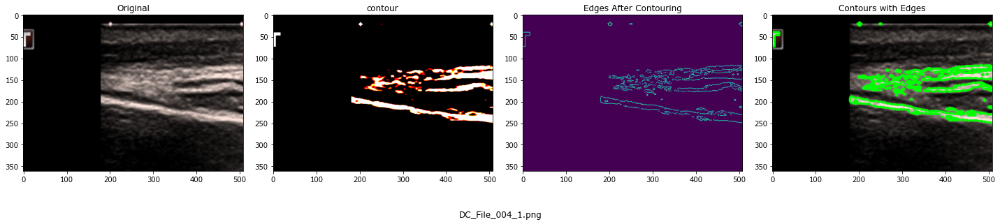

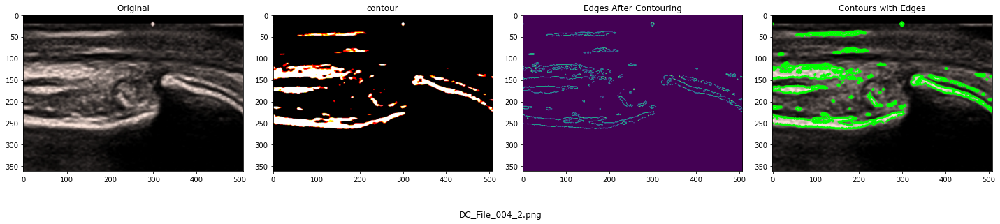

...

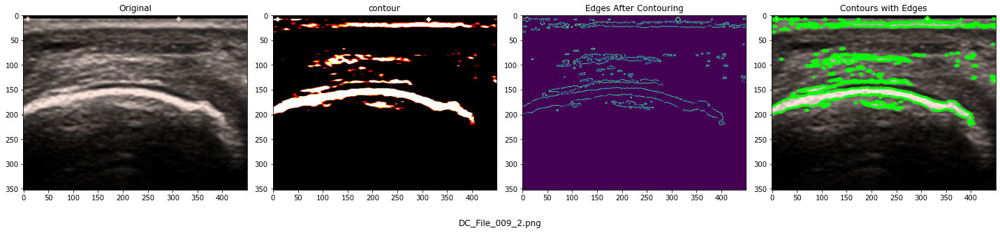

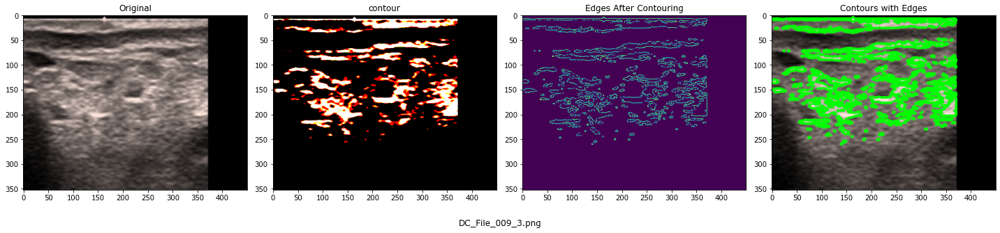

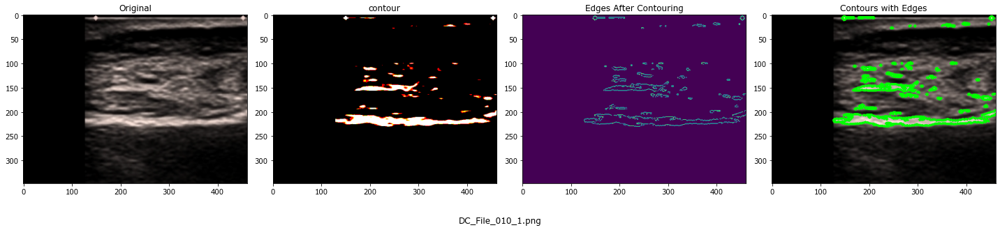

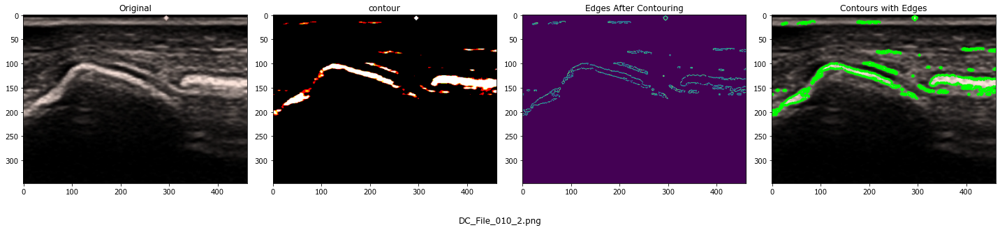

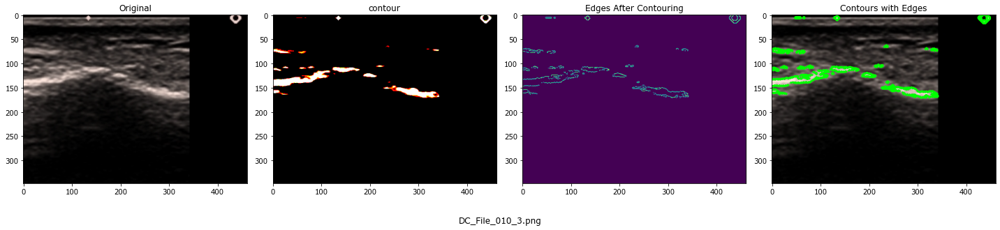

In [4]:
dir_path = r"D:Data\DC H-20220717T050807Z-001\DC H\Images"

        
for img_path in os.listdir(dir_path):
    draw_contour(img_path)

Number of figures (contours) found = 710
Number of figures (contours) found = 1123
Number of figures (contours) found = 849
Number of figures (contours) found = 2
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 524
Number of figures (contours) found = 936
Number of figures (contours) found = 1016
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 592
Number of figures (contours) found = 1178
Number of figures (contours) found = 389


D:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 115
Number of figures (contours) found = 609
Number of figures (contours) found = 291
Number of figures (contours) found = 0
Number of figures (contours) found = 60
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 166
Number of figures (contours) found = 907
Number of figures (contours) found = 169
Number of figures (contours) found = 23
Number of figures (contours) found = 19
Number of figures (contours) found = 0
Number of figures (contours) found = 3
Number of figures (contours) found = 0
Number of figures (contours) found = 0
Number of figures (contours) found = 134
Number o

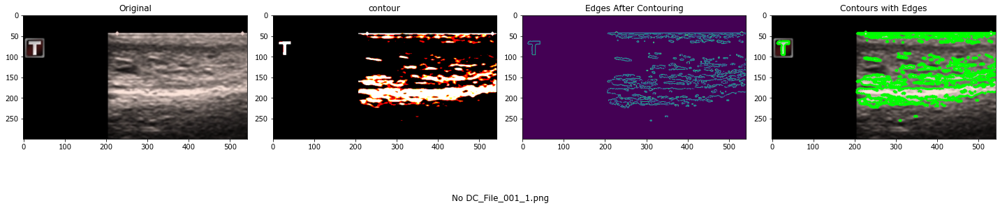

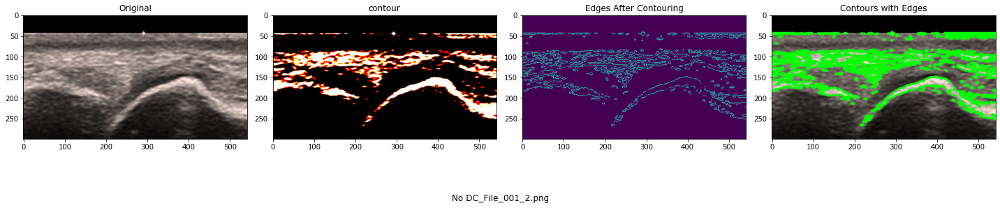

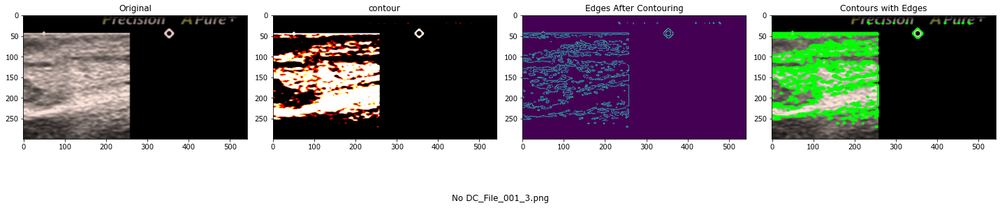

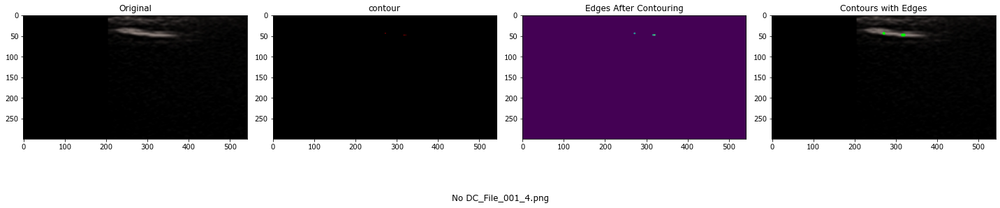

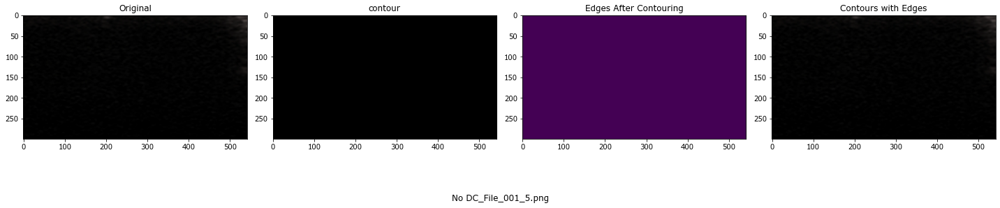

...

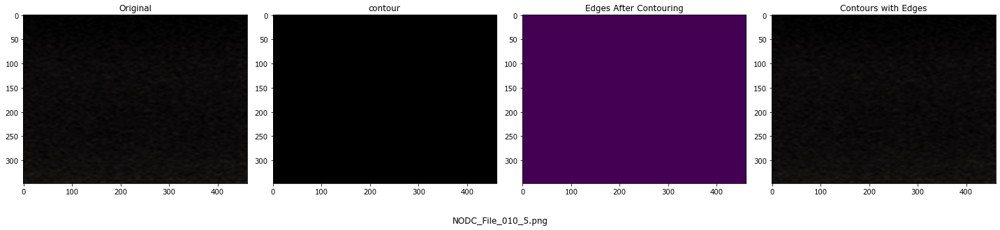

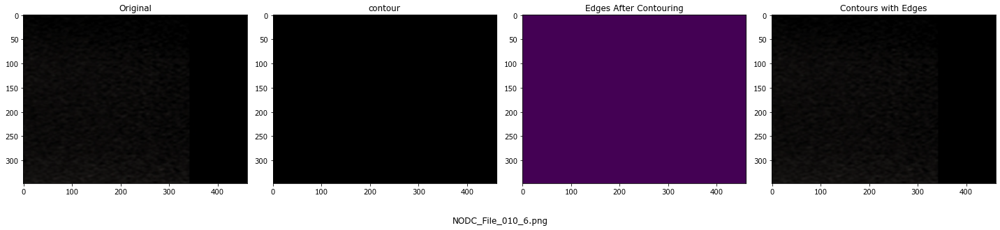

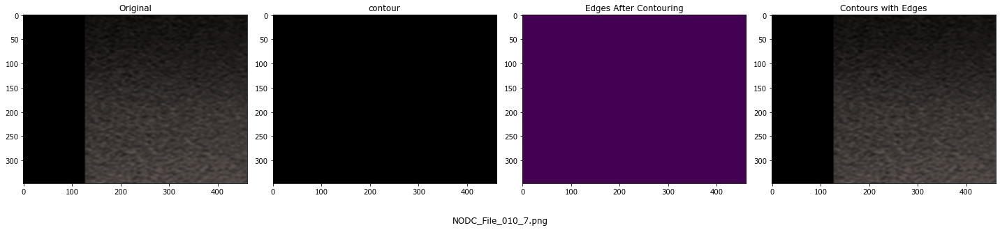

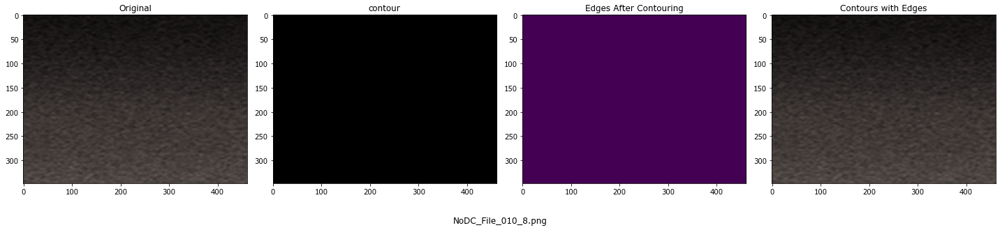

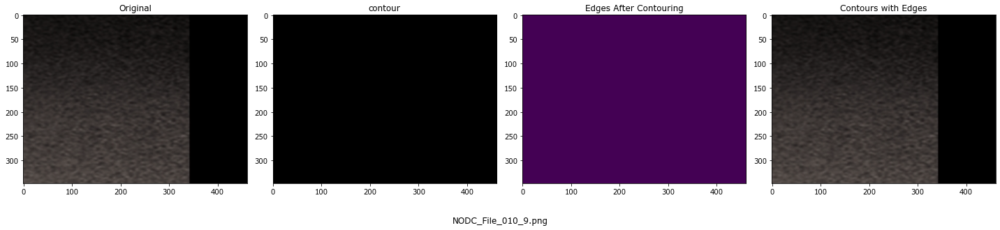

In [5]:
dir_path = r"D:\Data\NO DC H-20220717T050836Z-001\NO DC H\Images"


for img_path in os.listdir(dir_path):
    draw_contour(img_path)

### Creating a dataframe to manage the data 

In [6]:
filenames = os.listdir(r"D:\Data\Edges")
categories = []
for filename in filenames:
    category = filename.split('_')[1]
    if category == 'DC':
        categories.append("Double Contour")
    else:
        categories.append("Not Double Contour")

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

In [7]:
df

,filename,category
0,Edge_DC_File_001_2.png,Double Contour
1,Edge_DC_File_002_1.png,Double Contour
2,Edge_DC_File_003_2.png,Double Contour
3,Edge_DC_File_004_1.png,Double Contour
4,Edge_DC_File_004_2.png,Double Contour
...,...,...
130,Edge_NODC_File_010_5.png,Not Double Contour
131,Edge_NODC_File_010_6.png,Not Double Contour
132,Edge_NODC_File_010_7.png,Not Double Contour
133,Edge_NoDC_File_010_8.png,Not Double Contour


### Splitting data for cross-validation

In [8]:
train_df, validate_df = train_test_split(df, test_size = 0.20, random_state = 10)
train_df = train_df.reset_index(drop = True)
validate_df = validate_df.reset_index(drop = True)

In [9]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size = 8

In [10]:
image_shape = (1024, 1024, 3)

### Data augmentation

In [11]:
train_datagen = ImageDataGenerator(
                                    featurewise_center=True,  # set input mean to 0 over the dataset
                                    samplewise_center=True,  # set each sample mean to 0
                                    featurewise_std_normalization=True,  # divide inputs by std of the dataset
                                    samplewise_std_normalization=True,  # divide each input by its std
                                    rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
                                    zoom_range = 0.1, # Randomly zoom image 
                                    width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
                                    height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
                                    horizontal_flip=True,  # randomly flip images
                                    vertical_flip=True  # randomly flip images
                                   )

train_generator = train_datagen.flow_from_dataframe(
                                                    train_df, 
                                                    r"D:\Data\Edges", 
                                                    x_col = 'filename',
                                                    y_col = 'category',
                                                    target_size = image_shape[:2],
                                                    class_mode ='binary',
                                                    batch_size = batch_size,
                                                    )

Found 108 validated image filenames belonging to 2 classes.


In [12]:
train_generator.class_indices

{'Double Contour': 0, 'Not Double Contour': 1}

In [13]:
validation_datagen = ImageDataGenerator(rescale = 1./255)
validation_generator = validation_datagen.flow_from_dataframe(
                                                              validate_df, 
                                                              r"D:\Data\Edges", 
                                                              x_col = 'filename',
                                                              y_col = 'category',
                                                              target_size = image_shape[:2],
                                                              class_mode = 'binary',
                                                              batch_size = batch_size,
                                                              validate_filenames = False
                                                              )

Found 27 non-validated image filenames belonging to 2 classes.


### using an example to see if our augmentation works

In [14]:
example_df = train_df.sample(n = 1, random_state = 10).reset_index(drop = True)
example_generator = train_datagen.flow_from_dataframe(
                                                      example_df, 
                                                      r"D:\Data\Edges", 
                                                      x_col = 'filename',
                                                      y_col = 'category',
                                                      target_size = image_shape[:2],
                                                      class_mode = 'raw',
                                                      validate_filenames = False
                                                      )

Found 1 non-validated image filenames.


D:\Anaconda\envs\tensorflow\lib\site-packages\keras\preprocessing\image.py:1663: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
D:\Anaconda\envs\tensorflow\lib\site-packages\keras\preprocessing\image.py:1671: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for

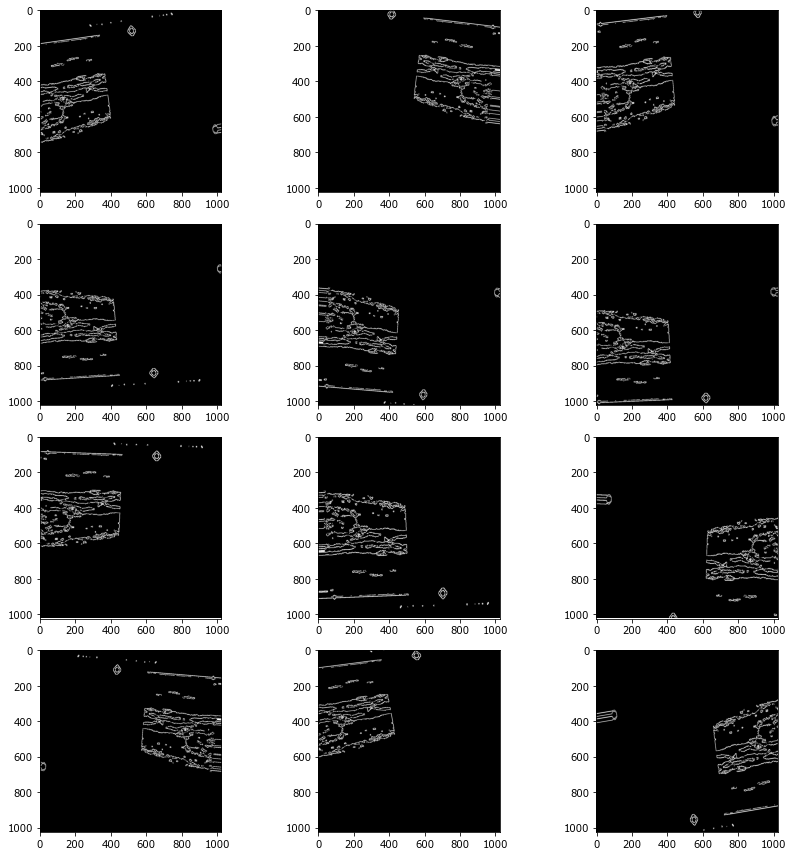

In [15]:
plt.figure(figsize = (12, 12))
for i in range(0, 12):
    plt.subplot(4, 3, i + 1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

## Model training

### Defining our model

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from tensorflow.keras.optimizers  import Adam

# Initialize a sequential model to group a linear stack of layers
model = Sequential()

# add Input layer to initialize sequential model

# add densely-connected NN layer with 16 hidden units
model.add(Conv2D(16, (3, 3), activation='relu', input_shape = image_shape))  # use ReLU activation function
model.add(BatchNormalization())                 # normalize and scale inputs or activations
model.add(MaxPooling2D((2,2), padding = 'same'))

model.add(Flatten())
# add densely-connected NN layer with 32 hidden units
model.add(Dense(32, activation='relu')) # use ReLU activation function
model.add(BatchNormalization())                # normalize and scale inputs or activations

# add densely-connected NN layer with 2 hidden units
model.add(Dense(1, activation='sigmoid')) # use Softmax activation function to do final predictions

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 1022, 1022, 16)    448       
                                                                 
 batch_normalization (BatchN  (None, 1022, 1022, 16)   64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 511, 511, 16)     0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 4177936)           0         
                                                                 
 dense (Dense)               (None, 32)                133693984 
                                                                 
 batch_normalization_1 (Batc  (None, 32)               1

In [17]:
# compile the built CNN model by selecting suitable optimizer and loss function
model.compile(optimizer= Adam(learning_rate= 0.0001) , loss='binary_crossentropy', metrics=['accuracy'])

In [18]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience = 20)

In [19]:
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_accuracy', 
                                            patience = 4, 
                                            verbose = 1, 
                                            factor = 0.5, 
                                            min_lr = 0.00001)

In [20]:
callbacks = [earlystop, learning_rate_reduction]

### Fitting and training our model

In [21]:
# train the model with appropriate number of epochs
epochs = 50
model_details = model.fit(train_generator, 
                          validation_data=validation_generator, 
                          epochs=epochs, 
                          callbacks = callbacks, class_weight = {0:5, 1:1})

Epoch 1/50
14/14 [==============================] - 40s 3s/step - loss: 0.9188 - accuracy: 0.7500 - val_loss: 0.8443 - val_accuracy: 0.1111 - lr: 1.0000e-04
Epoch 2/50
14/14 [==============================] - 42s 3s/step - loss: 0.7726 - accuracy: 0.8148 - val_loss: 0.8263 - val_accuracy: 0.1111 - lr: 1.0000e-04
Epoch 3/50
14/14 [==============================] - 41s 3s/step - loss: 0.7628 - accuracy: 0.8056 - val_loss: 0.8516 - val_accuracy: 0.1111 - lr: 1.0000e-04
Epoch 4/50
14/14 [==============================] - 41s 3s/step - loss: 0.7214 - accuracy: 0.8241 - val_loss: 0.8656 - val_accuracy: 0.1111 - lr: 1.0000e-04
Epoch 5/50
14/14 [==============================] - ETA: 0s - loss: 0.7970 - accuracy: 0.8241
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
14/14 [==============================] - 40s 3s/step - loss: 0.7970 - accuracy: 0.8241 - val_loss: 0.8823 - val_accuracy: 0.1111 - lr: 1.0000e-04
Epoch 6/50
14/14 [==============================] - 39s 

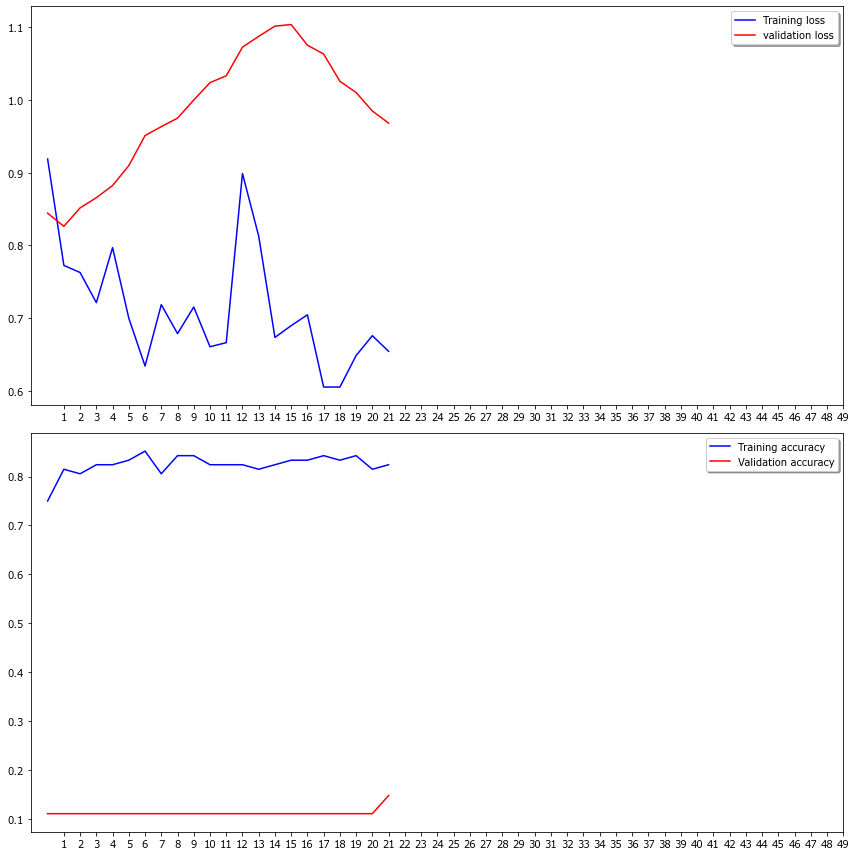

In [22]:
# Vizualizing our model performance

plt.style.use('tableau-colorblind10')
fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (12, 12))
ax1.plot(model_details.history['loss'], color = 'b', label = "Training loss")
ax1.plot(model_details.history['val_loss'], color = 'r', label = "validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))

ax1.legend(loc = 'best', shadow = True)

ax2.plot(model_details.history['accuracy'], color = 'b', label = "Training accuracy")
ax2.plot(model_details.history['val_accuracy'], color = 'r',label = "Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

ax2.legend(loc = 'best', shadow = True)
plt.tight_layout()
plt.show()

In [23]:
# function to predict on custom data

def predict(img_path):
    image = cv2.imread(img_path)
    ret, img_thresh = cv2.threshold(image, 150, 255, cv2.THRESH_BINARY)
    image_reshaped = cv2.resize(img_thresh, (1024, 1024))
 
    edges = cv2.Canny(img_thresh, 100, 150)
    x = np.stack((np.array(image_reshaped))*3, axis=1)
    x = x.reshape((-1, 1024, 1024, 3))
    x = x/255.
    plt.imshow(image)
    preds = model.predict(x)
    
    # if preds == 1:
    #     return ("Double Contour")
    # else:
    #     return("Not Double Contour")
    
    return preds
    

Not double contour
1/1 [==============================] - 0s 211ms/step


array([[0.3524129]], dtype=float32)

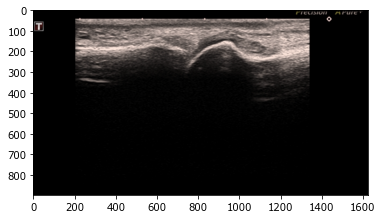

In [24]:
print("Not double contour")
predict(r"D:\Data\NODC_File_001.png")

Not Double contour
1/1 [==============================] - 0s 120ms/step


array([[0.45747876]], dtype=float32)

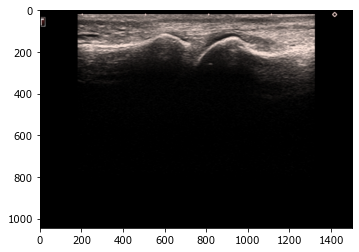

In [25]:
print("Not Double contour")
predict(r"D:\Data\NODC_File_002.png")

Double contour
1/1 [==============================] - 0s 174ms/step


array([[0.3776364]], dtype=float32)

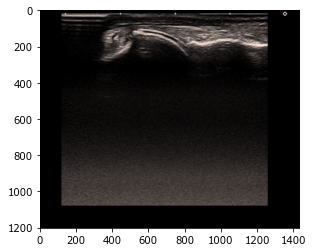

In [26]:
print("Double contour")
predict(r"D:\Data\File_001.png")

Double contour
1/1 [==============================] - 0s 129ms/step


array([[0.38254836]], dtype=float32)

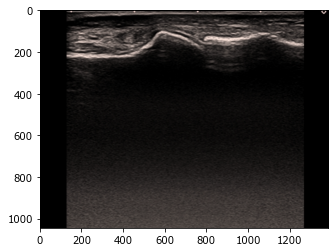

In [27]:
print("Double contour")
predict(r"D:\Data\File_010.png")